# Skopje Air Pollution

## Introduction

The city of Skopje is well known for its struggles with poor air quality, especially in the winter months. The main pollutants are CO, NO2, ozone, and particulate matter of different dimensions.

Monitoring stations for measuring the concentrations of each of the main pollutants have been installed in different locations around the city.

## Import Libraries
Before we begin, let us import the libraries that we will be using (Pandas, matplotlib and seaborn). Any additional libraries that we decide to import we will add in this cell.

In [1]:
# import libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import calendar
import matplotlib.dates as mdates

## The Dataset
The following data has been taken from kaggle (https://www.kaggle.com/datasets/cokastefan/pm10-pollution-data-in-skopje-from-2008-to-2018) where data from the monitoring stations (https://air.moepp.gov.mk/?page_id=175) for the period from Januаr 2007 to December 2018 has been compiled in a single dataset. To make our task more managable, we will only be looking at data for the time period of five years, from January 2012 to December 2016.

## Import data
The data is contained in the directory CSVs in the files (CO.csv, NO2.csv, O3.csv, PM10.csv, and PM25.csv). Let's import the data from the CSV files as separate pandas dataframes.

In [2]:
# Importing the data from the CSV files as separate dataframes:

co_df = pd.read_csv("CSVs/CO.csv")
no2_df = pd.read_csv("CSVs/NO2.csv")
o3_df = pd.read_csv("CSVs/O3.csv")
pm10_df = pd.read_csv("CSVs/PM10.csv")
pm25_df = pd.read_csv("CSVs/PM25.csv") 


## Review Data
Let's display each of the dataframes and look at the data types in order to get a sense of the data. Check that the data types are accurate.

In [3]:
co_df

,Unnamed: 0.1,Unnamed: 0,Centar,GaziBaba,Karpos,Lisice,Miladinovci,Mobile,Rektorat,time
0,36212,36212,0.2876,0.9219,0.5644,NaN,NaN,NaN,0.3708,2012-01-01 00:00:00
1,36213,36213,0.1538,1.2029,0.8275,NaN,0.3858,NaN,0.4097,2012-01-01 01:00:00
2,36214,36214,0.1600,1.3198,0.7423,NaN,0.3346,NaN,0.4061,2012-01-01 02:00:00
3,36215,36215,0.1699,1.1449,0.4445,NaN,0.3549,NaN,0.6500,2012-01-01 03:00:00
4,36216,36216,0.1539,0.8092,0.5121,NaN,0.2553,NaN,0.7198,2012-01-01 04:00:00
...,...,...,...,...,...,...,...,...,...,...
45302,81514,81514,NaN,1.3572,0.5898,0.3828,0.5220,NaN,0.4292,2016-12-31 19:00:00
45303,81515,81515,NaN,0.9164,0.8474,2.2388,0.4060,NaN,1.8676,2016-12-31 20:00:00
45304,81516,81516,NaN,1.7400,1.3342,2.4592,0.4060,NaN,1.7632,2016-12-31 21:00:00
45305,81517,81517,NaN,3.0392,0.9611,4.4660,0.4872,NaN,2.5056,2016-12-31 22:00:00


In [4]:
co_df.info()
print(co_df)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45307 entries, 0 to 45306
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0.1  45307 non-null  int64  
 1   Unnamed: 0    45307 non-null  int64  
 2   Centar        28020 non-null  float64
 3   GaziBaba      36042 non-null  float64
 4   Karpos        40426 non-null  float64
 5   Lisice        35184 non-null  float64
 6   Miladinovci   23316 non-null  float64
 7   Mobile        0 non-null      float64
 8   Rektorat      23816 non-null  float64
 9   time          45307 non-null  object 
dtypes: float64(7), int64(2), object(1)
memory usage: 3.5+ MB
       Unnamed: 0.1  Unnamed: 0  Centar  GaziBaba  Karpos  Lisice  \
0             36212       36212  0.2876    0.9219  0.5644     NaN   
1             36213       36213  0.1538    1.2029  0.8275     NaN   
2             36214       36214  0.1600    1.3198  0.7423     NaN   
3             36215       36215  0.16

In [5]:
no2_df

,Unnamed: 0.1,Unnamed: 0,Centar,GaziBaba,Karpos,Lisice,Miladinovci,Mobile,Rektorat,time
0,36212,36212,27.5615,NaN,31.1979,40.2691,NaN,NaN,NaN,2012-01-01 00:00:00
1,36213,36213,16.1041,NaN,34.4904,33.3520,NaN,NaN,NaN,2012-01-01 01:00:00
2,36214,36214,2.8074,NaN,3.2517,32.6270,NaN,NaN,NaN,2012-01-01 02:00:00
3,36215,36215,2.3009,NaN,27.3558,27.2408,NaN,NaN,NaN,2012-01-01 03:00:00
4,36216,36216,20.5436,NaN,39.6147,41.2352,NaN,NaN,NaN,2012-01-01 04:00:00
...,...,...,...,...,...,...,...,...,...,...
45302,81514,81514,NaN,NaN,28.3310,6.1120,9.5882,NaN,35.3658,2016-12-31 19:00:00
45303,81515,81515,NaN,NaN,29.9614,11.1926,10.4286,NaN,37.2691,2016-12-31 20:00:00
45304,81516,81516,NaN,NaN,35.5054,11.8422,5.5008,NaN,39.1076,2016-12-31 21:00:00
45305,81517,81517,NaN,NaN,32.5632,14.9171,NaN,NaN,34.8592,2016-12-31 22:00:00


In [6]:
no2_df.info()
print(no2_df)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45307 entries, 0 to 45306
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0.1  45307 non-null  int64  
 1   Unnamed: 0    45307 non-null  int64  
 2   Centar        38043 non-null  float64
 3   GaziBaba      24500 non-null  float64
 4   Karpos        40452 non-null  float64
 5   Lisice        35048 non-null  float64
 6   Miladinovci   14761 non-null  float64
 7   Mobile        0 non-null      float64
 8   Rektorat      9993 non-null   float64
 9   time          45307 non-null  object 
dtypes: float64(7), int64(2), object(1)
memory usage: 3.5+ MB
       Unnamed: 0.1  Unnamed: 0   Centar  GaziBaba   Karpos   Lisice  \
0             36212       36212  27.5615       NaN  31.1979  40.2691   
1             36213       36213  16.1041       NaN  34.4904  33.3520   
2             36214       36214   2.8074       NaN   3.2517  32.6270   
3             36215      

In [7]:
o3_df

,Unnamed: 0.1,Unnamed: 0,Centar,GaziBaba,Karpos,Lisice,Miladinovci,Mobile,Rektorat,time
0,36212,36212,22.6658,NaN,22.7910,8.0383,NaN,NaN,7.1541,2012-01-01 00:00:00
1,36213,36213,33.9524,NaN,2.4778,10.0362,NaN,NaN,6.4485,2012-01-01 01:00:00
2,36214,36214,32.6988,NaN,15.6506,9.9571,NaN,NaN,9.1569,2012-01-01 02:00:00
3,36215,36215,31.9470,NaN,25.6524,13.4646,NaN,NaN,5.5608,2012-01-01 03:00:00
4,36216,36216,31.5400,NaN,14.6374,8.0210,NaN,NaN,8.2465,2012-01-01 04:00:00
...,...,...,...,...,...,...,...,...,...,...
45302,81514,81514,NaN,NaN,30.7700,34.0600,34.58,NaN,7.9279,2016-12-31 19:00:00
45303,81515,81515,NaN,NaN,39.0296,10.0400,33.06,NaN,5.9459,2016-12-31 20:00:00
45304,81516,81516,NaN,NaN,37.0228,3.7200,35.14,NaN,5.4855,2016-12-31 21:00:00
45305,81517,81517,NaN,NaN,35.2526,4.7400,34.88,NaN,6.0661,2016-12-31 22:00:00


In [8]:
o3_df.info()
print(o3_df)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45307 entries, 0 to 45306
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0.1  45307 non-null  int64  
 1   Unnamed: 0    45307 non-null  int64  
 2   Centar        41936 non-null  float64
 3   GaziBaba      0 non-null      float64
 4   Karpos        40364 non-null  float64
 5   Lisice        43311 non-null  float64
 6   Miladinovci   29757 non-null  float64
 7   Mobile        0 non-null      float64
 8   Rektorat      39615 non-null  float64
 9   time          45307 non-null  object 
dtypes: float64(7), int64(2), object(1)
memory usage: 3.5+ MB
       Unnamed: 0.1  Unnamed: 0   Centar  GaziBaba   Karpos   Lisice  \
0             36212       36212  22.6658       NaN  22.7910   8.0383   
1             36213       36213  33.9524       NaN   2.4778  10.0362   
2             36214       36214  32.6988       NaN  15.6506   9.9571   
3             36215      

In [9]:
pm10_df

,Unnamed: 0.1,Unnamed: 0,Centar,GaziBaba,Karpos,Lisice,Miladinovci,Mobile,Rektorat,time
0,36212,36212,33.3369,147.0360,53.5518,51.4799,4.0717,NaN,67.7699,2012-01-01 00:00:00
1,36213,36213,22.7030,186.4710,91.0442,40.2183,17.1251,NaN,84.1200,2012-01-01 01:00:00
2,36214,36214,20.7956,176.7180,66.4194,51.9866,13.7951,NaN,77.5800,2012-01-01 02:00:00
3,36215,36215,24.9218,101.5350,49.4371,57.2999,20.7067,NaN,87.2300,2012-01-01 03:00:00
4,36216,36216,26.9868,84.2333,53.2615,53.7198,14.1101,NaN,90.7400,2012-01-01 04:00:00
...,...,...,...,...,...,...,...,...,...,...
45302,81514,81514,NaN,122.3900,65.5215,41.2800,63.2700,NaN,76.5900,2016-12-31 19:00:00
45303,81515,81515,NaN,136.1000,89.7657,84.6299,63.9700,NaN,173.3600,2016-12-31 20:00:00
45304,81516,81516,NaN,162.1200,109.1280,175.8600,62.9200,NaN,202.9400,2016-12-31 21:00:00
45305,81517,81517,NaN,278.6000,84.5262,190.0100,55.2900,NaN,220.9400,2016-12-31 22:00:00


In [10]:
pm10_df.info()
print(pm10_df)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45307 entries, 0 to 45306
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0.1  45307 non-null  int64  
 1   Unnamed: 0    45307 non-null  int64  
 2   Centar        41619 non-null  float64
 3   GaziBaba      29716 non-null  float64
 4   Karpos        43091 non-null  float64
 5   Lisice        43731 non-null  float64
 6   Miladinovci   34249 non-null  float64
 7   Mobile        0 non-null      float64
 8   Rektorat      43678 non-null  float64
 9   time          45307 non-null  object 
dtypes: float64(7), int64(2), object(1)
memory usage: 3.5+ MB
       Unnamed: 0.1  Unnamed: 0   Centar  GaziBaba    Karpos    Lisice  \
0             36212       36212  33.3369  147.0360   53.5518   51.4799   
1             36213       36213  22.7030  186.4710   91.0442   40.2183   
2             36214       36214  20.7956  176.7180   66.4194   51.9866   
3             362

In [11]:
pm25_df

,Unnamed: 0.1,Unnamed: 0,Centar,GaziBaba,Karpos,Lisice,Miladinovci,Mobile,Rektorat,time
0,36212,36212,21.8149,NaN,39.5599,NaN,NaN,NaN,NaN,2012-01-01 00:00:00
1,36213,36213,14.4168,NaN,65.5437,NaN,NaN,NaN,NaN,2012-01-01 01:00:00
2,36214,36214,13.0873,NaN,50.5635,NaN,NaN,NaN,NaN,2012-01-01 02:00:00
3,36215,36215,16.0224,NaN,38.8961,NaN,NaN,NaN,NaN,2012-01-01 03:00:00
4,36216,36216,17.1630,NaN,39.8982,NaN,NaN,NaN,NaN,2012-01-01 04:00:00
...,...,...,...,...,...,...,...,...,...,...
45302,81514,81514,NaN,NaN,56.7961,NaN,NaN,NaN,NaN,2016-12-31 19:00:00
45303,81515,81515,NaN,NaN,80.1820,NaN,NaN,NaN,NaN,2016-12-31 20:00:00
45304,81516,81516,NaN,NaN,96.3556,NaN,NaN,NaN,NaN,2016-12-31 21:00:00
45305,81517,81517,NaN,NaN,70.3649,NaN,NaN,NaN,NaN,2016-12-31 22:00:00


In [12]:
pm25_df.info()
print(pm25_df)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45307 entries, 0 to 45306
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0.1  45307 non-null  int64  
 1   Unnamed: 0    45307 non-null  int64  
 2   Centar        41092 non-null  float64
 3   GaziBaba      0 non-null      float64
 4   Karpos        33990 non-null  float64
 5   Lisice        0 non-null      float64
 6   Miladinovci   0 non-null      float64
 7   Mobile        0 non-null      float64
 8   Rektorat      0 non-null      float64
 9   time          45307 non-null  object 
dtypes: float64(7), int64(2), object(1)
memory usage: 3.5+ MB
       Unnamed: 0.1  Unnamed: 0   Centar  GaziBaba   Karpos  Lisice  \
0             36212       36212  21.8149       NaN  39.5599     NaN   
1             36213       36213  14.4168       NaN  65.5437     NaN   
2             36214       36214  13.0873       NaN  50.5635     NaN   
3             36215       362

## Data cleaning and restructuring
Because the mobile column is from a mobile monitoring station located in the municipality of Butel and occasionally displaced, we can drop that column.

We can also rename the column time to datetime and create additional separate time and date columns. 

We can add a column in each of the dataframes indicating the type of pollutant and concatenate the dataframes.

In [13]:
# Drop the column 'Mobile' from every data frame

dataframes = [co_df, no2_df, o3_df, pm10_df, pm25_df]
col_drop = 'Mobile'

for df in dataframes:
    df.drop(col_drop, axis=1, inplace=True)

# df

In [14]:
# Rename the column 'time' to 'Datetime'

for df in dataframes:
    df['Datetime'] = df.pop('time')

# df

In [15]:
# Creating additional separate time and date columns 

for df in dataframes:
    
    df['Datetime'] = pd.to_datetime(df['Datetime']) 
    df['Time'] = df['Datetime'].dt.time 
    df['Date'] = df['Datetime'].dt.date

# df

In [16]:
# Merging all the dataframes

pollutants = ['CO', 'NO2', 'O3', 'PM10', 'PM25']

for i, df in enumerate(dataframes):
    df['Pollutant'] = pollutants[i]

con_df = pd.concat(dataframes, ignore_index=True) 

In [17]:
# Deleting the columns 'Unnamed: 0.1','Unnamed: 0'. We will not need them for further requirements.
  
con_df = con_df.drop(columns=['Unnamed: 0.1','Unnamed: 0'], axis=1)


In [18]:
df = con_df
# df

In [19]:
# Filter the data from 01.01.2012 to 31.12.2016

filtered_df = df.loc[(df['Datetime'].dt.year >= 2012) & (df['Datetime'].dt.year <= 2016)]

In [20]:
# df.isna().sum()
# df.info()
df

,Centar,GaziBaba,Karpos,Lisice,Miladinovci,Rektorat,Datetime,Time,Date,Pollutant
0,0.2876,0.9219,0.5644,NaN,NaN,0.3708,2012-01-01 00:00:00,00:00:00,2012-01-01,CO
1,0.1538,1.2029,0.8275,NaN,0.3858,0.4097,2012-01-01 01:00:00,01:00:00,2012-01-01,CO
2,0.1600,1.3198,0.7423,NaN,0.3346,0.4061,2012-01-01 02:00:00,02:00:00,2012-01-01,CO
3,0.1699,1.1449,0.4445,NaN,0.3549,0.6500,2012-01-01 03:00:00,03:00:00,2012-01-01,CO
4,0.1539,0.8092,0.5121,NaN,0.2553,0.7198,2012-01-01 04:00:00,04:00:00,2012-01-01,CO
...,...,...,...,...,...,...,...,...,...,...
226530,NaN,NaN,56.7961,NaN,NaN,NaN,2016-12-31 19:00:00,19:00:00,2016-12-31,PM25
226531,NaN,NaN,80.1820,NaN,NaN,NaN,2016-12-31 20:00:00,20:00:00,2016-12-31,PM25
226532,NaN,NaN,96.3556,NaN,NaN,NaN,2016-12-31 21:00:00,21:00:00,2016-12-31,PM25
226533,NaN,NaN,70.3649,NaN,NaN,NaN,2016-12-31 22:00:00,22:00:00,2016-12-31,PM25


# Question 1
What location in Skopje has the highest average pollution for each of the pollutants? .......... (2 points)

In [21]:
# Solution

locations = ['Centar', 'GaziBaba', 'Karpos', 'Lisice', 'Miladinovci', 'Rektorat']

avg_pollution = df.groupby('Pollutant')[locations].mean()
highest_pollution_loc = avg_pollution.idxmax(axis=1)

print(f'Average pollution value for each of the pollutants:\n\n{avg_pollution}\n\n')
print(f'Location with the highest average pollution for each of the pollutants:\n\n{highest_pollution_loc}') 

Average pollution value for each of the pollutants:

              Centar   GaziBaba     Karpos     Lisice  Miladinovci   Rektorat
Pollutant                                                                    
CO          0.636974   0.659270   0.491527   1.434637     0.506763   1.447373
NO2        31.677129  23.726933  23.690122  14.651303    16.389865  32.466578
O3         33.141041        NaN  41.618611  25.004915    44.651675  25.539394
PM10       72.032849  83.023884  63.127388  91.219661    46.308727  67.979790
PM25       40.391040        NaN  46.549356        NaN          NaN        NaN


Location with the highest average pollution for each of the pollutants:

Pollutant
CO         Rektorat
NO2        Rektorat
O3      Miladinovci
PM10         Lisice
PM25         Karpos
dtype: object


# Question 2
For every year, for each of the pollutants, on what time stamp is the maximum pollution for every location? What time of the year seems to have the most pollution in Skopje? .......... (2 points)

In [22]:
# Creating an empty list to store the results
result = []

# Iterate over each year
for year in df['Datetime'].dt.year.unique():
    year_df = df[df['Datetime'].dt.year == year]
    
    # Iterate over each pollutant
    for pollutant in pollutants:
        pollutant_df = year_df[year_df['Pollutant'] == pollutant]
        
        # Iterate over each location
        for location in locations:
            location_df = pollutant_df[pollutant_df[location].notnull()]
            
            # Skip the iteration if there are no data for the location
            if location_df.empty:
                result.append({
                    'Year': year,
                    'Pollutant': pollutant,
                    'Location': location,
                    'Maximum pollution time': 'No data provided',
                    'Month with maximum pollution': 'No data provided'
                })
                continue
            
            # Find the index of the maximum pollution value for the current location
            max_poll_idx = location_df[location].idxmax()  
            
            # Take the maximum pollution time from the original dataframe using the index
            max_timestamp = df.loc[max_poll_idx, 'Time']
            
            # Group the data by month and calculate the maximum pollution value
            max_monthly_pollution = location_df.groupby(location_df['Datetime'].dt.month)[location].max()
            
            # Find the month with the maximum pollution value
            max_month = max_monthly_pollution.idxmax()
            
            # Append the result as a dictionary to the result list
            result.append({
                'Year': year,
                'Pollutant': pollutant,
                'Location': location,
                'Maximum pollution time': max_timestamp,
                'Month with maximum pollution': max_month
            })
    
# Create a new dataframe from the result list
result_df = pd.DataFrame(result)

# Show whole dataframe
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

print(result_df)

     Year Pollutant     Location Maximum pollution time  \
0    2012        CO       Centar               22:00:00   
1    2012        CO     GaziBaba               19:00:00   
2    2012        CO       Karpos               18:00:00   
3    2012        CO       Lisice               22:00:00   
4    2012        CO  Miladinovci               22:00:00   
5    2012        CO     Rektorat               13:00:00   
6    2012       NO2       Centar               11:00:00   
7    2012       NO2     GaziBaba               14:00:00   
8    2012       NO2       Karpos               17:00:00   
9    2012       NO2       Lisice               13:00:00   
10   2012       NO2  Miladinovci       No data provided   
11   2012       NO2     Rektorat               10:00:00   
12   2012        O3       Centar               19:00:00   
13   2012        O3     GaziBaba       No data provided   
14   2012        O3       Karpos               17:00:00   
15   2012        O3       Lisice               15:00:00 

In [23]:
# Calculate the most polluted period of time in Skopje

most_common_month = result_df['Month with maximum pollution'].value_counts().idxmax()

month_name = calendar.month_name[int(most_common_month)]

print('The most polluted time of the year in Skopje is', month_name)

The most polluted time of the year in Skopje is December


# Question 3
In what month of the year is the average polution accross locations highest for each of the pollutants? .......... (2 points)

In [24]:
# Solution

monthly_avg_pollution = df.groupby(['Pollutant', df['Datetime'].dt.strftime('%B')])[locations].mean()
highest_pollution_month = monthly_avg_pollution.groupby('Pollutant').idxmax()

print('Month of the year with the highest average polution accross locations for each of the pollutants:\n')
print(highest_pollution_month)


Month of the year with the highest average polution accross locations for each of the pollutants:

                     Centar          GaziBaba            Karpos  \
Pollutant                                                         
CO           (CO, December)    (CO, December)    (CO, December)   
NO2         (NO2, December)   (NO2, December)   (NO2, December)   
O3               (O3, July)               NaN        (O3, July)   
PM10       (PM10, December)  (PM10, December)  (PM10, December)   
PM25       (PM25, December)               NaN  (PM25, December)   

                     Lisice      Miladinovci          Rektorat  
Pollutant                                                       
CO           (CO, December)   (CO, December)     (CO, January)  
NO2          (NO2, January)   (NO2, January)   (NO2, December)  
O3               (O3, July)       (O3, July)      (O3, August)  
PM10       (PM10, December)  (PM10, January)  (PM10, December)  
PM25                    NaN              

# Question 4
What is the average pollution accross locations in every hour during the day?  .......... (2 points)

For calculating the average pollution across locations in every hour during a day we need to calculate AQI for each hour during a day. I have searched the web and links above to find the official formula for calculating AQI in Macedonia, but it is not provided. For creating a formula of that kind, i need more official information. 
As the closest solution i will demonstrate a way to find the average pollution per pollutant across locations at each hour during the day.

In [25]:
# Solution 1

avg_pollution_by_hour_per_pollutant = df.groupby(['Time', 'Pollutant'])[locations].mean().reset_index()

for pollutant in avg_pollution_by_hour_per_pollutant['Pollutant'].unique():
    pollutant_data = avg_pollution_by_hour_per_pollutant[avg_pollution_by_hour_per_pollutant['Pollutant'] == pollutant]
    
    print(f'Average pollution for {pollutant} across locations in every hour during the day:')
    print(pollutant_data)
    print()

Average pollution for CO across locations in every hour during the day:
         Time Pollutant    Centar  GaziBaba    Karpos    Lisice  Miladinovci  \
0    00:00:00        CO  0.800970  0.844273  0.700463  2.189421     0.522455   
5    01:00:00        CO  0.725401  0.826719  0.625996  1.982519     0.486933   
10   02:00:00        CO  0.638791  0.761041  0.541605  1.733168     0.461639   
15   03:00:00        CO  0.558911  0.712069  0.476797  1.488823     0.442299   
20   04:00:00        CO  0.483128  0.642719  0.414351  1.299225     0.428331   
25   05:00:00        CO  0.447812  0.601476  0.373103  1.147581     0.423532   
30   06:00:00        CO  0.423899  0.577098  0.341103  1.108214     0.432321   
35   07:00:00        CO  0.474047  0.558282  0.350336  1.267712     0.500632   
40   08:00:00        CO  0.653045  0.609793  0.452155  1.463494     0.558803   
45   09:00:00        CO  0.715758  0.662981  0.452459  1.272030     0.540199   
50   10:00:00        CO  0.625487  0.633796  0.4

In [26]:
# Solution 2

avg_pollution_by_hour_per_pollutant2 = df.groupby(['Pollutant', df['Datetime'].dt.hour])[locations].mean()
avg_pollution_by_hour_per_pollutant2 = avg_pollution_by_hour_per_pollutant2.unstack(level='Pollutant')

print('average pollution per pollutant accross locations in every hour during the day:')
print(avg_pollution_by_hour_per_pollutant2)

average pollution per pollutant accross locations in every hour during the day:
             Centar                                              GaziBaba  \
Pollutant        CO        NO2         O3       PM10       PM25        CO   
Datetime                                                                    
0          0.800970  31.366039  22.550587  84.791004  47.517792  0.844273   
1          0.725401  28.664436  22.762657  81.751309  45.847443  0.826719   
2          0.638791  24.815371  23.487237  78.911928  44.079726  0.761041   
3          0.558911  21.227112  24.492101  75.929098  42.165218  0.712069   
4          0.483128  18.882361  24.543678  71.435497  39.275728  0.642719   
5          0.447812  17.650674  23.994179  69.746281  38.052584  0.601476   
6          0.423899  18.971225  21.984764  68.146771  36.874867  0.577098   
7          0.474047  23.821288  19.093805  68.363348  37.105097  0.558282   
8          0.653045  29.955928  19.439493  71.100748  39.004286  0.609793

# Question 5
Calculate and display the average daily pollution accross locations on separate plots for each of the pollutants over time. .......... (3 points)@

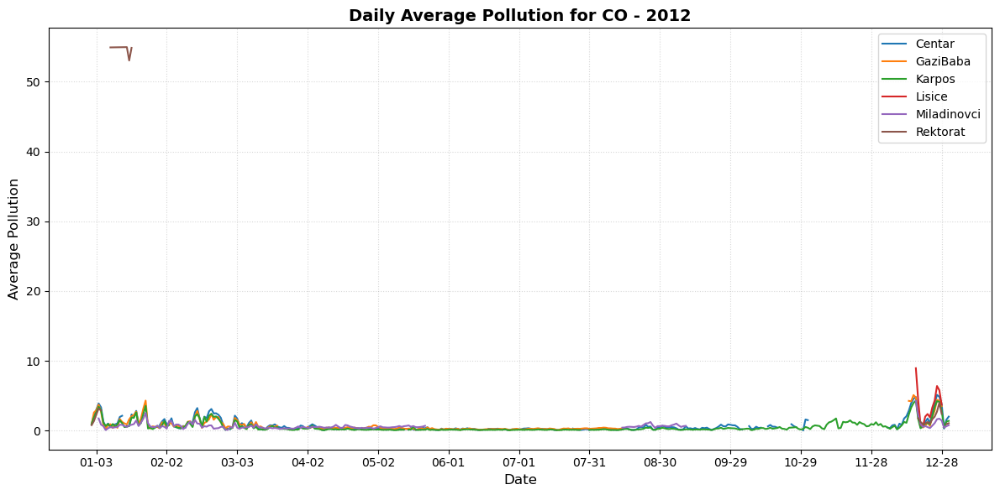

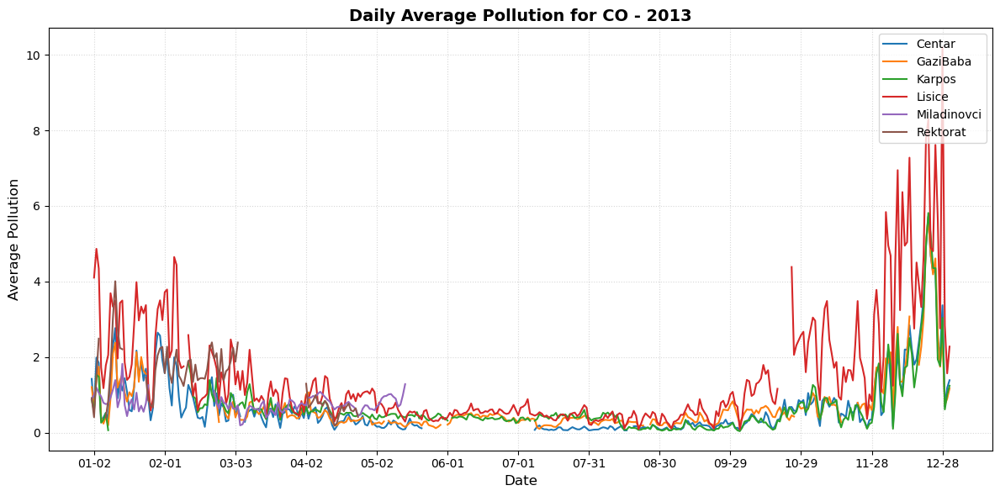

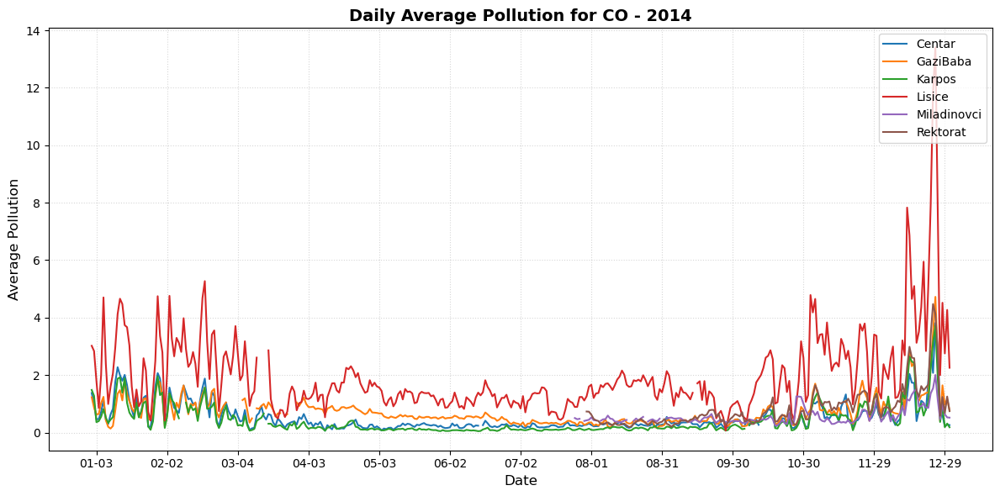

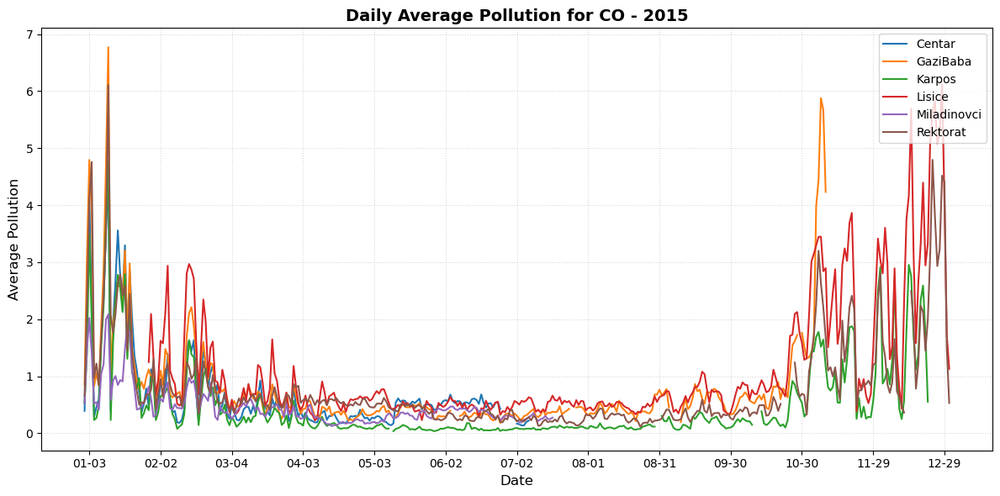

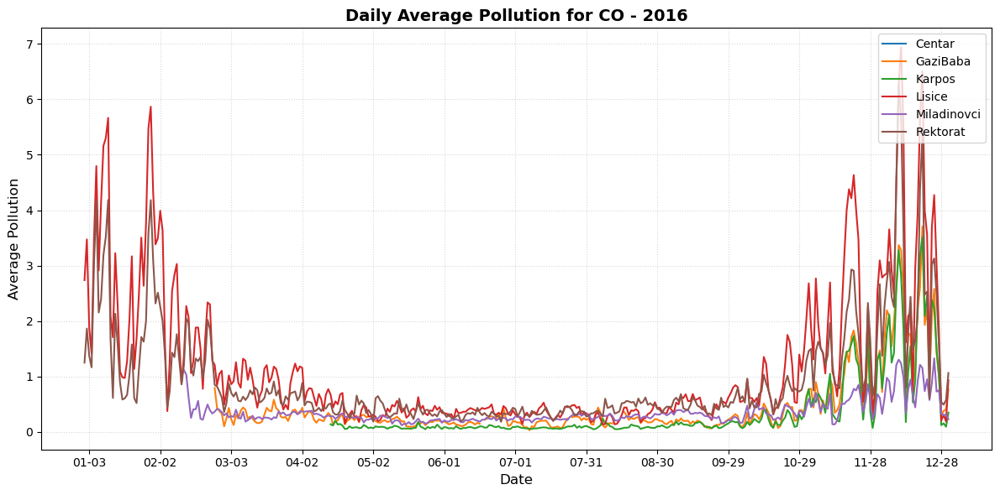

...

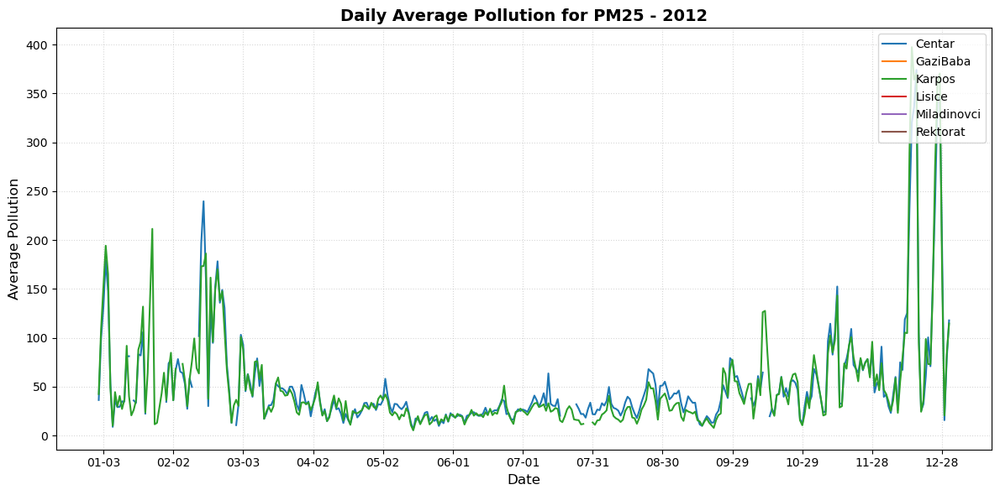

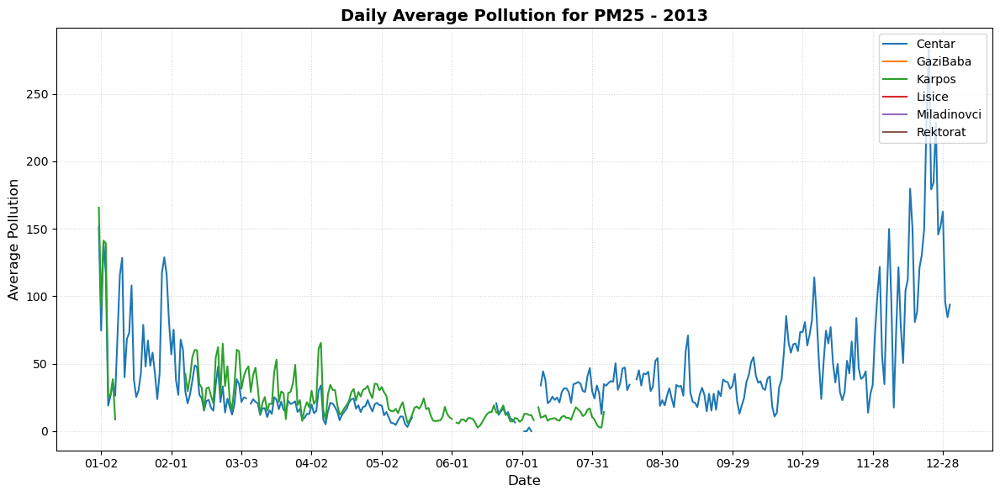

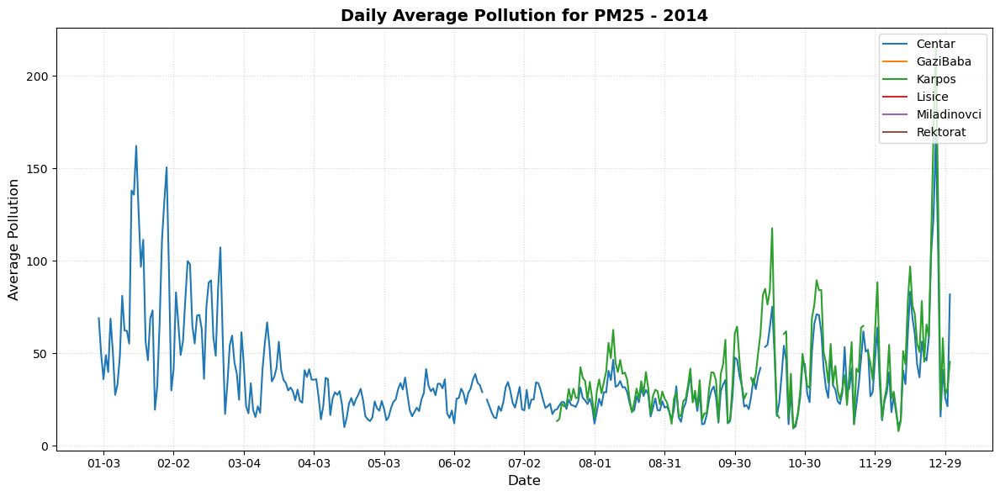

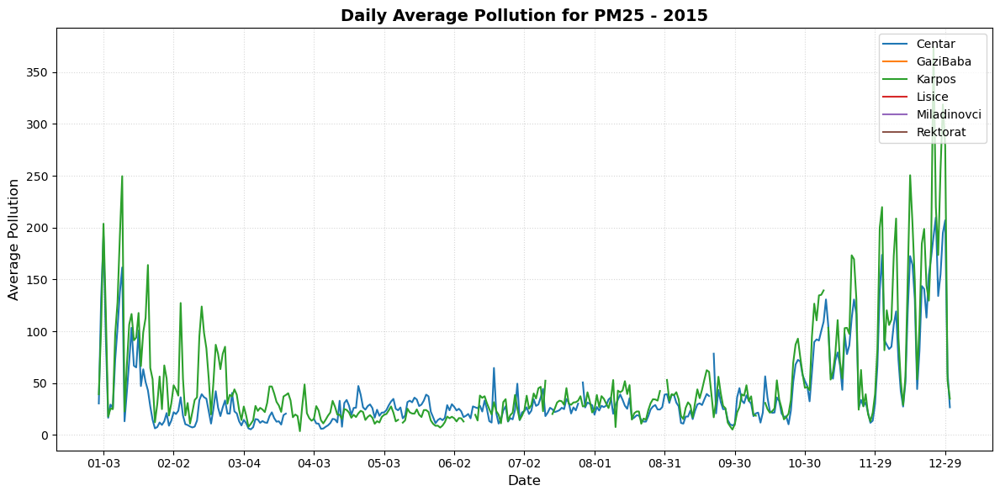

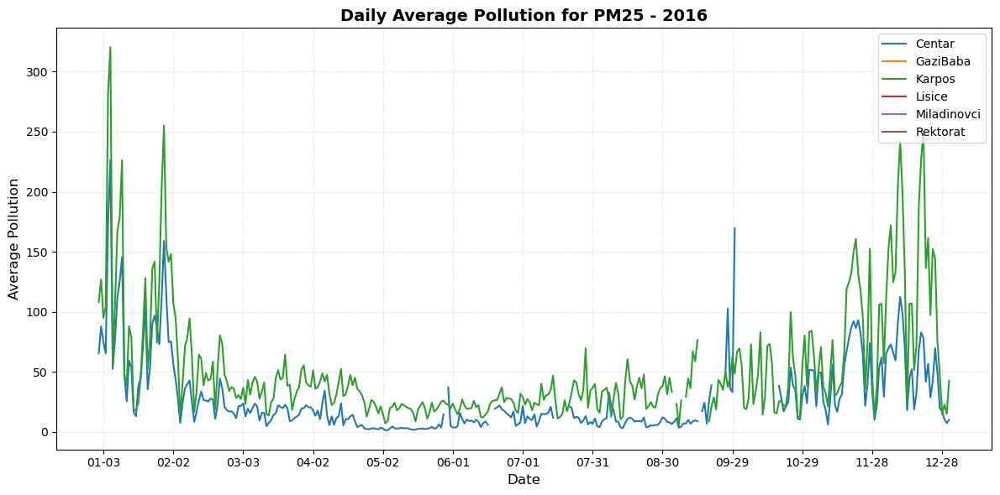

In [27]:
# Solution 1

pollutants = df['Pollutant'].unique()

for pollutant in pollutants:
    for year in df['Datetime'].dt.year.unique():
        plt.figure(figsize=(12, 6))
        
        data = df.loc[(df['Pollutant'] == pollutant) & (df['Datetime'].dt.year == year)].set_index('Datetime')
        daily_avg = data.groupby(pd.Grouper(freq='D')).mean(numeric_only=True)
        
        for location in locations:
            plt.plot(daily_avg.index, daily_avg[location], label=location)
        
        plt.title(f'Daily Average Pollution for {pollutant} - {year}', fontsize=14, fontweight='bold')
        plt.xlabel('Date', fontsize=12)
        plt.ylabel('Average Pollution', fontsize=12)
        plt.legend(loc='upper right')
        
        # Format x-axis tick labels as month-day
        plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
        plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=30))  # Show tick every 30 days
        
        plt.grid(True, linestyle='dotted', alpha=0.5)
        plt.tight_layout()  # Improve figure spacing
        
        plt.show()

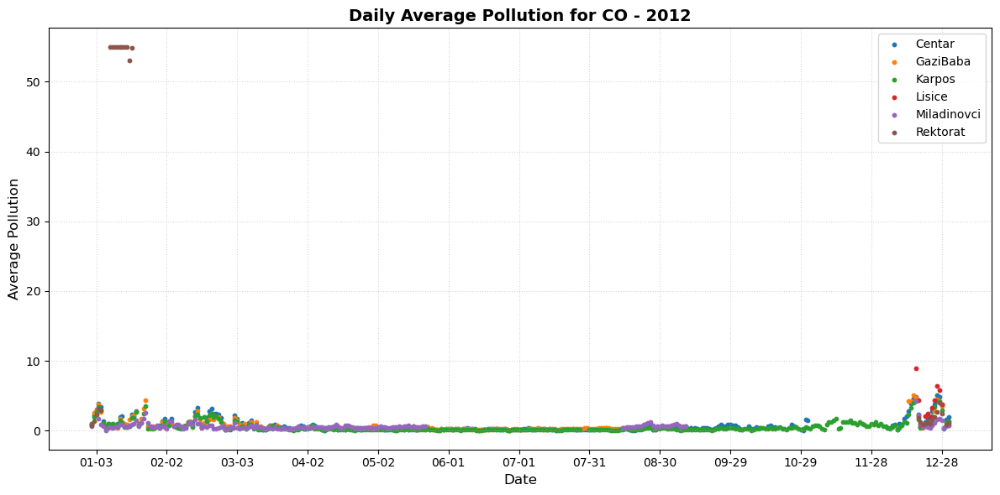

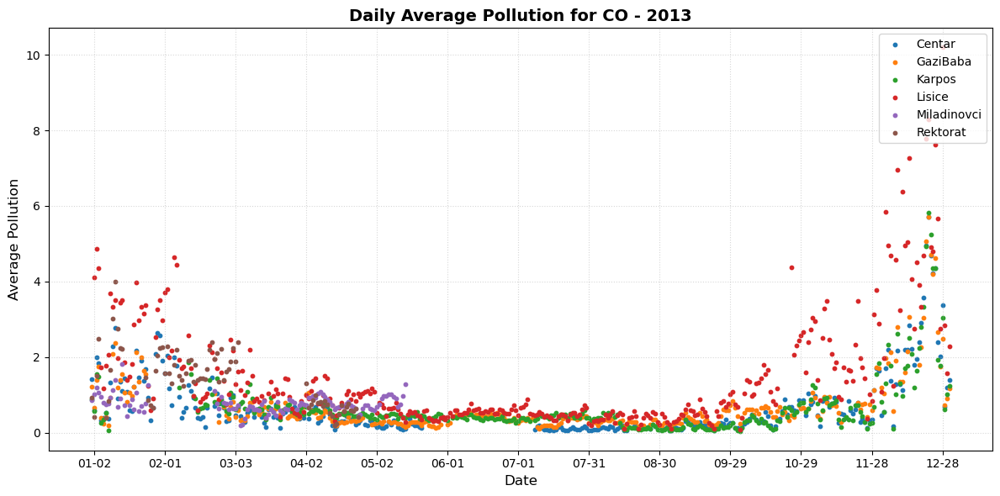

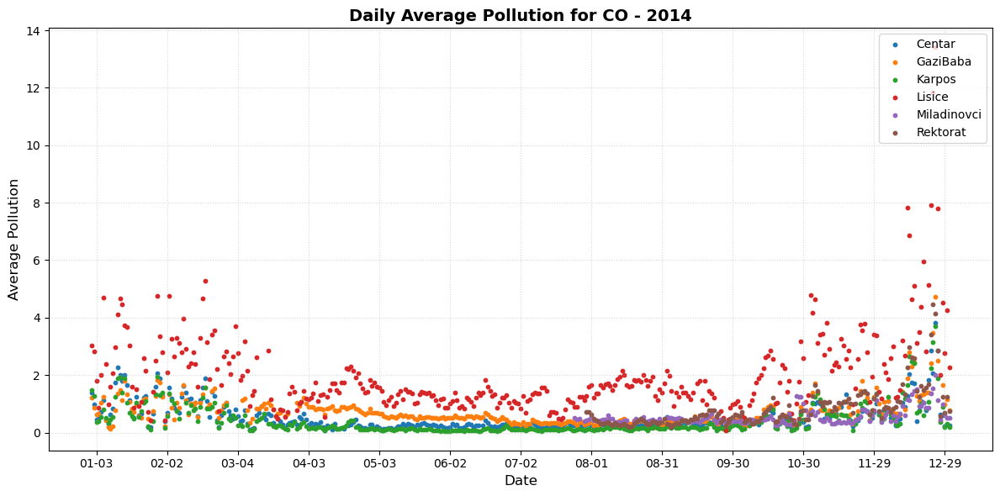

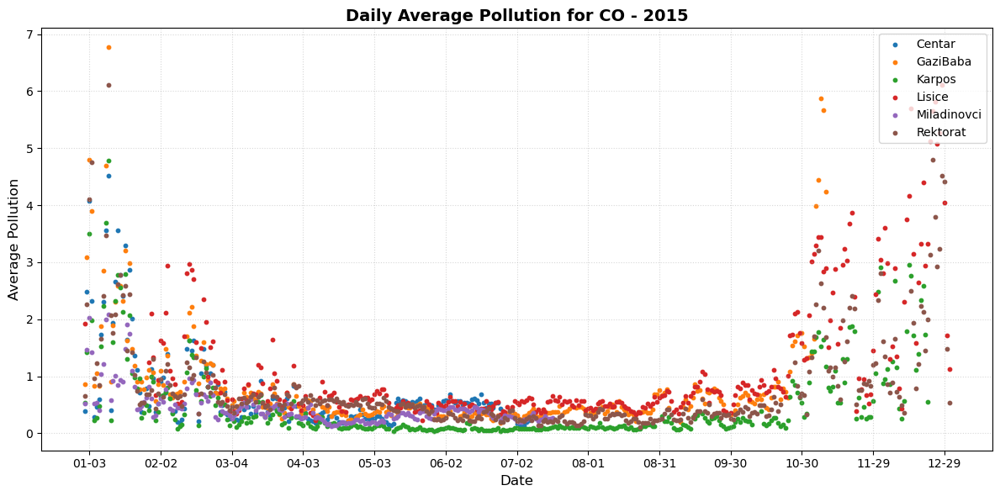

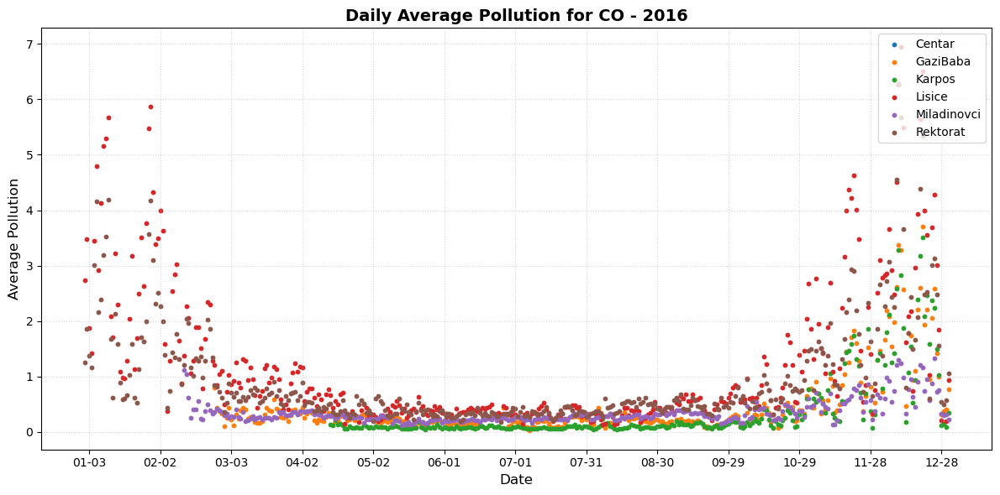

...

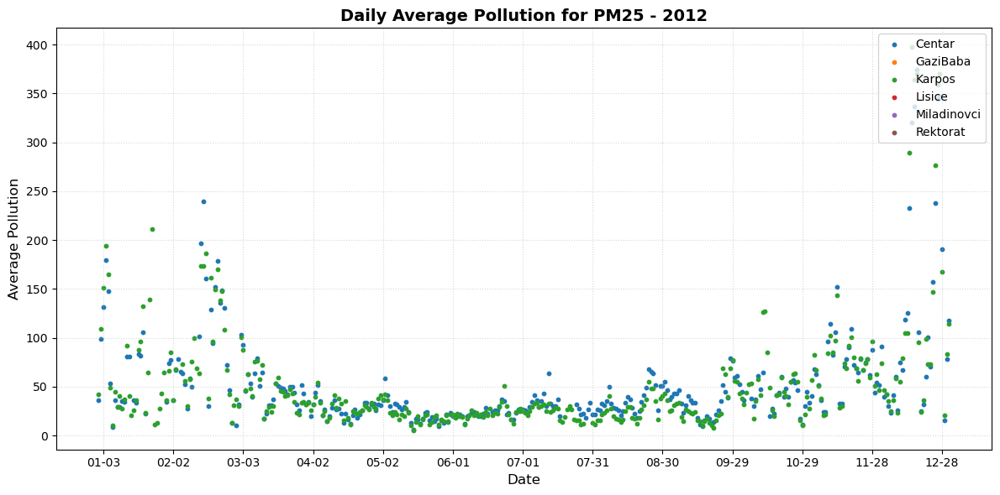

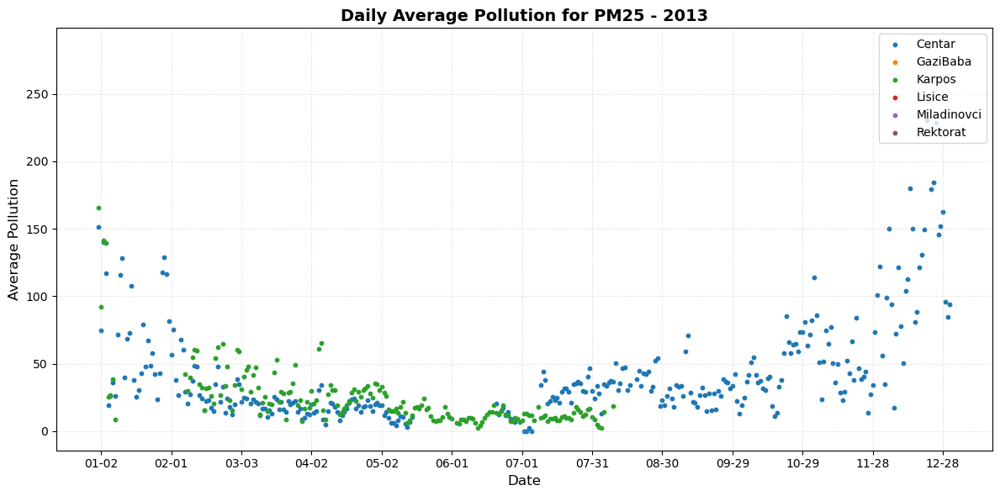

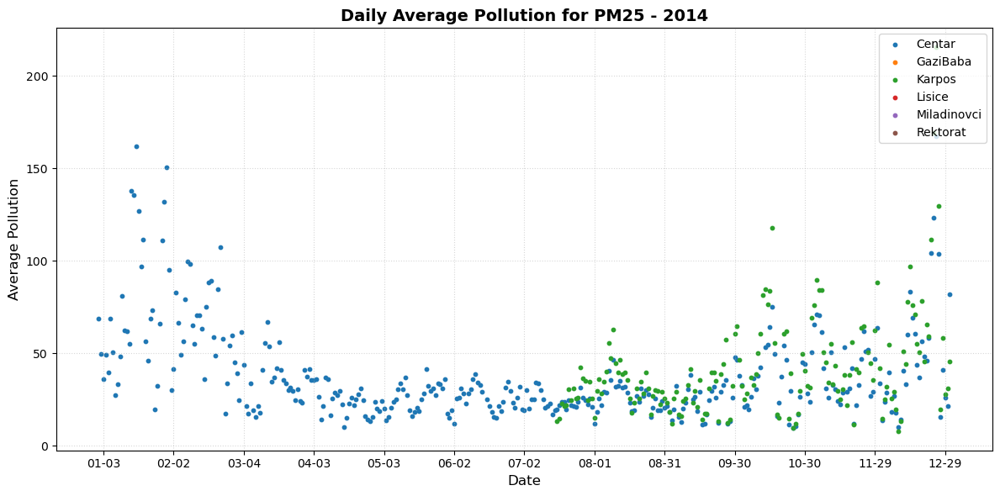

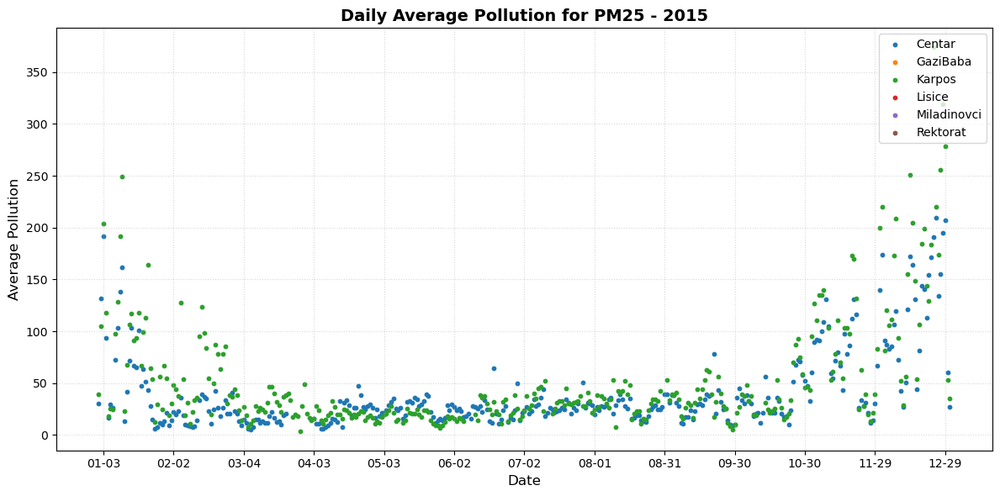

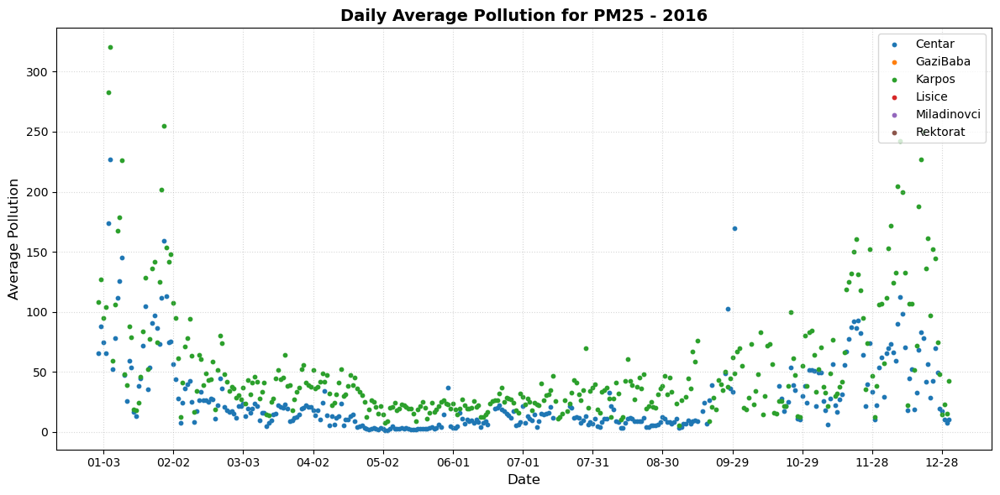

In [28]:
# Solution 1.1

pollutants = df['Pollutant'].unique()

for pollutant in pollutants:
    for year in df['Datetime'].dt.year.unique():
        plt.figure(figsize=(12, 6))
        
        data = df.loc[(df['Pollutant'] == pollutant) & (df['Datetime'].dt.year == year)].set_index('Datetime')
        daily_avg = data.groupby(pd.Grouper(freq='D')).mean(numeric_only=True)
        
        for location in locations:
            plt.scatter(daily_avg.index, daily_avg[location], label=location, s=10)
        
        plt.title(f'Daily Average Pollution for {pollutant} - {year}', fontsize=14, fontweight='bold')
        plt.xlabel('Date', fontsize=12)
        plt.ylabel('Average Pollution', fontsize=12)
        plt.legend(loc='upper right')
        
        # Format x-axis tick labels as month-day
        plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
        plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=30))  # Show tick every 30 days
        
        plt.grid(True, linestyle='dotted', alpha=0.5)
        plt.tight_layout()  # Improve figure spacing
        
        plt.show()

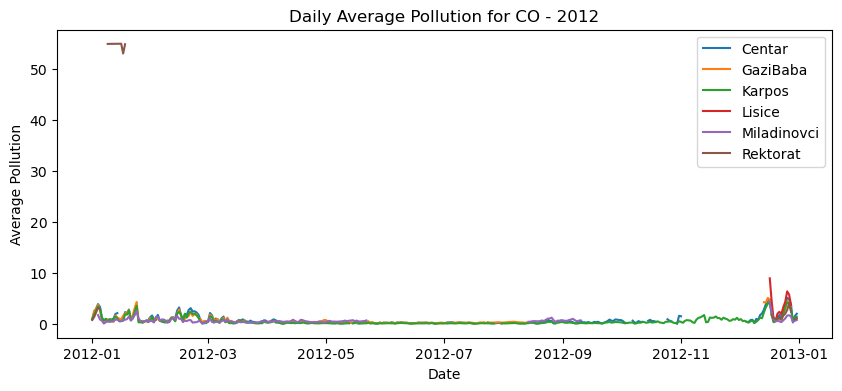

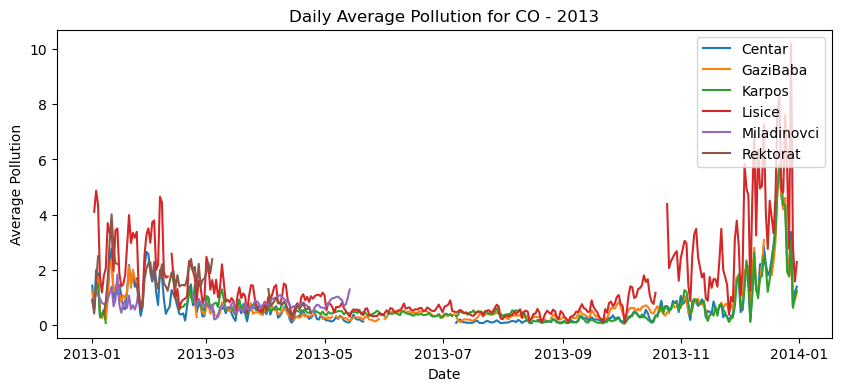

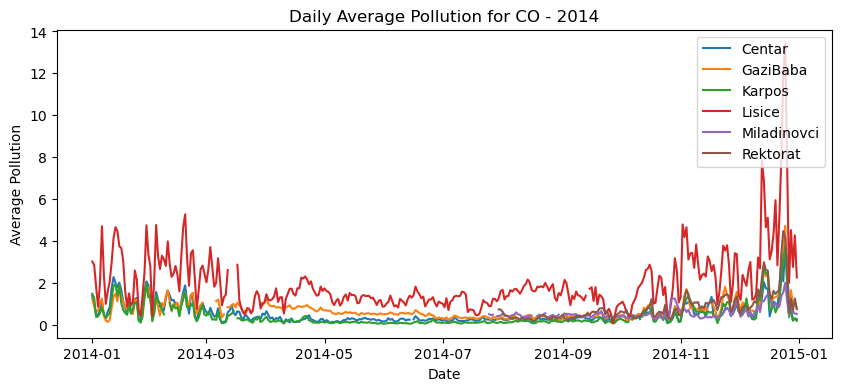

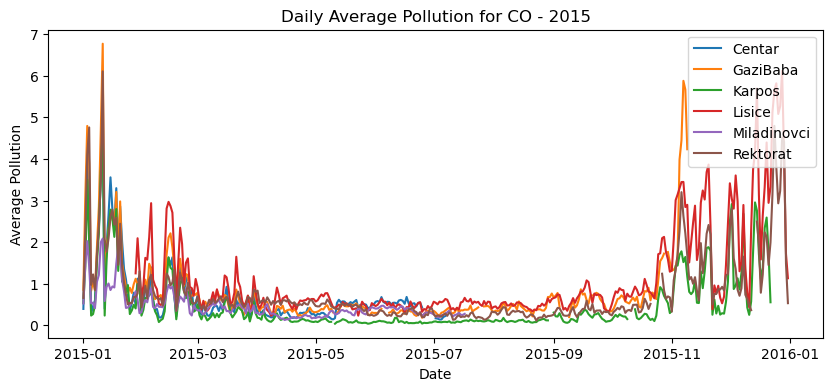

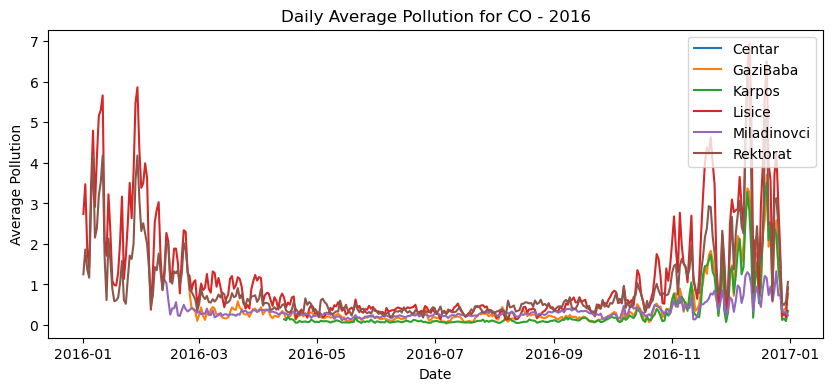

...

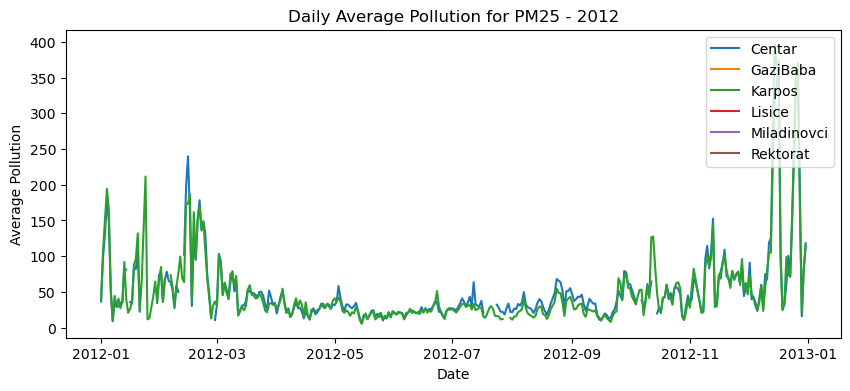

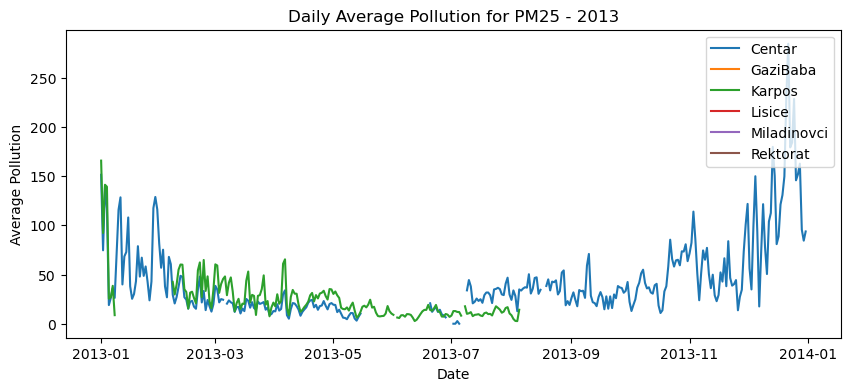

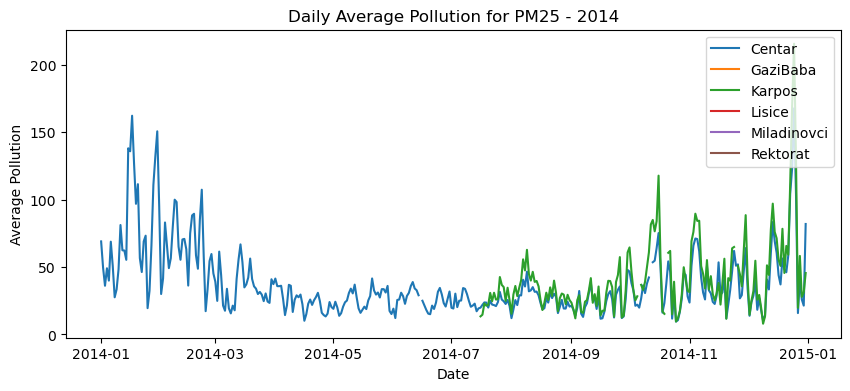

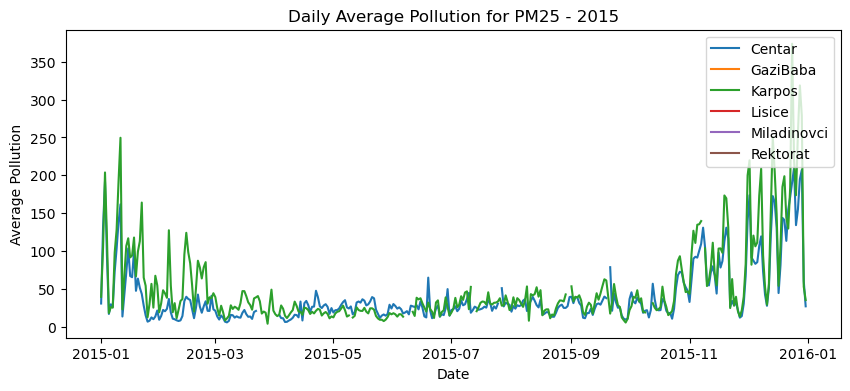

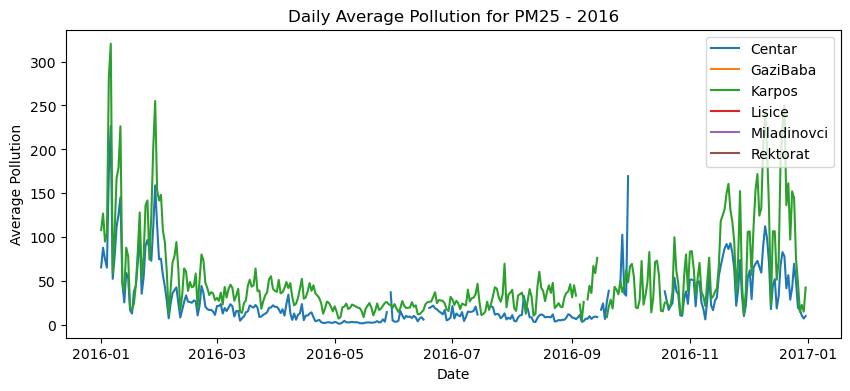

In [29]:
# Solution 1.2

pollutants = df['Pollutant'].unique()

for pollutant in pollutants:
    for year in df['Datetime'].dt.year.unique():
        plt.figure(figsize=(10, 4))
        
        data = df.loc[(df['Pollutant'] == pollutant) & (df['Datetime'].dt.year == year)].set_index('Datetime')
        daily_avg = data.groupby(pd.Grouper(freq='D')).mean(numeric_only=True)
        
        for location in locations:
            plt.plot(daily_avg.index, daily_avg[location], label=location)
        
        plt.title(f'Daily Average Pollution for {pollutant} - {year}')
        plt.xlabel('Date')
        plt.ylabel('Average Pollution')
        plt.legend(loc='upper right')
        plt.show()

<Figure size 1000x400 with 0 Axes>

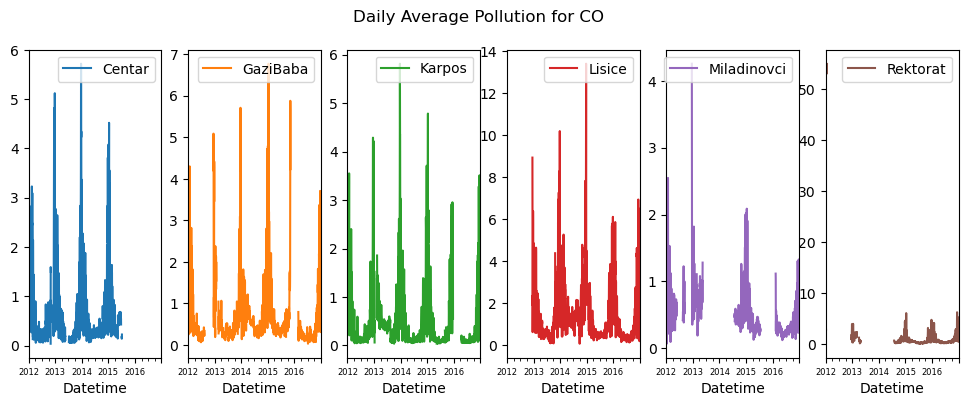

<Figure size 1000x400 with 0 Axes>

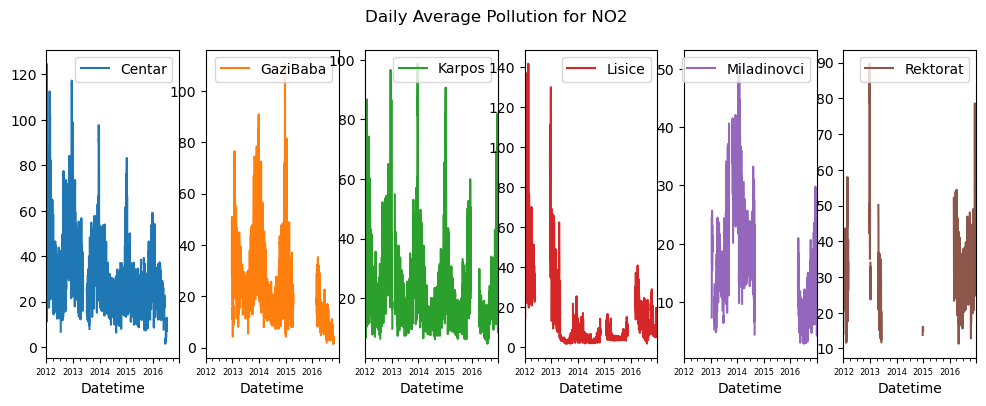

<Figure size 1000x400 with 0 Axes>

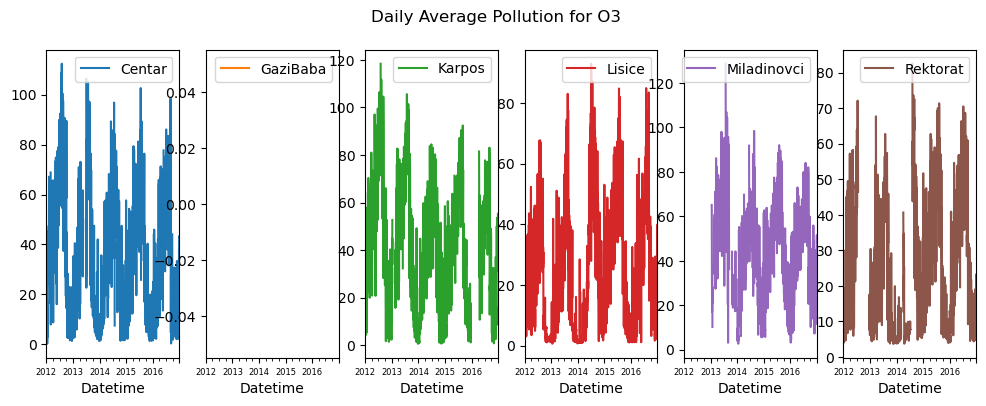

<Figure size 1000x400 with 0 Axes>

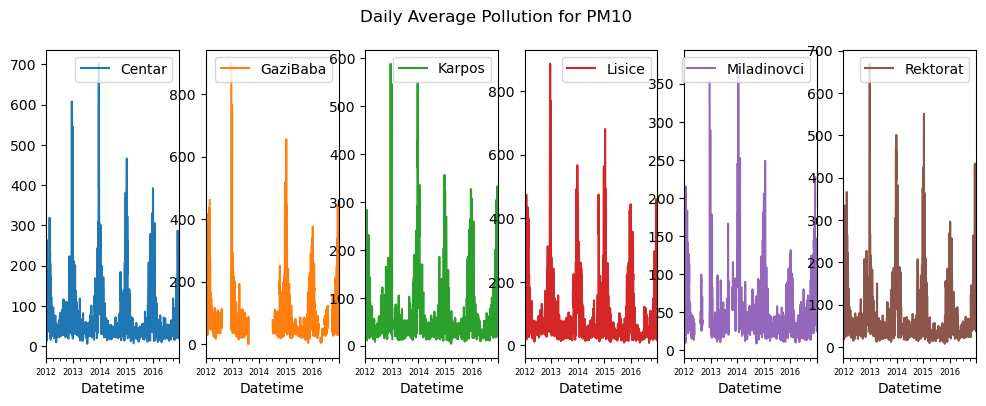

<Figure size 1000x400 with 0 Axes>

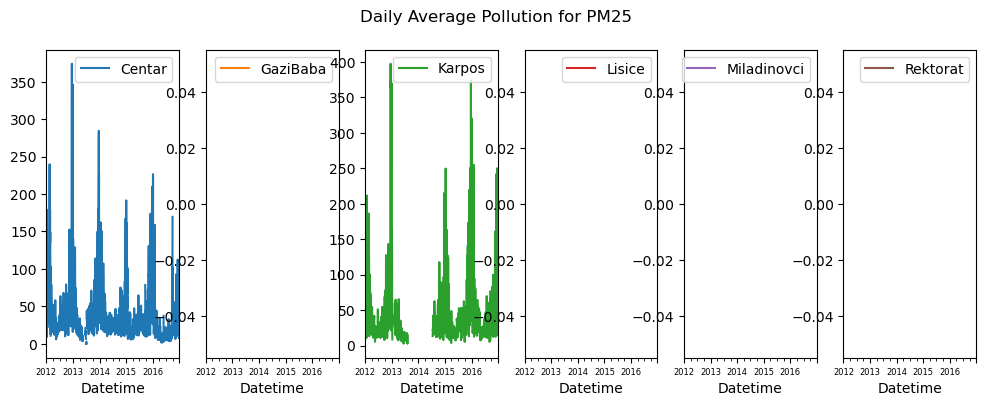

In [30]:
# Solution 2

pollutants = df['Pollutant'].unique()

for pollutant in pollutants:
    plt.figure(figsize=(10, 4))
    
    data = df.loc[df['Pollutant'] == pollutant].set_index('Datetime')
    daily_avg = data.groupby(pd.Grouper(freq='D')).mean(numeric_only=True)
    
    axes = daily_avg[locations].plot(subplots=True, layout=(1, len(locations)), figsize=(12, 4))
    
    plt.suptitle(f'Daily Average Pollution for {pollutant}')
    
    for ax in axes.flat:
        ax.tick_params(axis='x', labelsize=6) 
    
    plt.show()

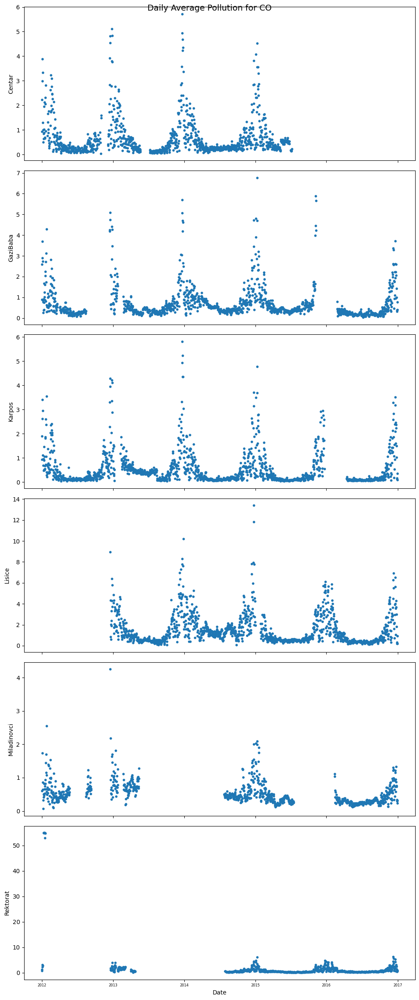

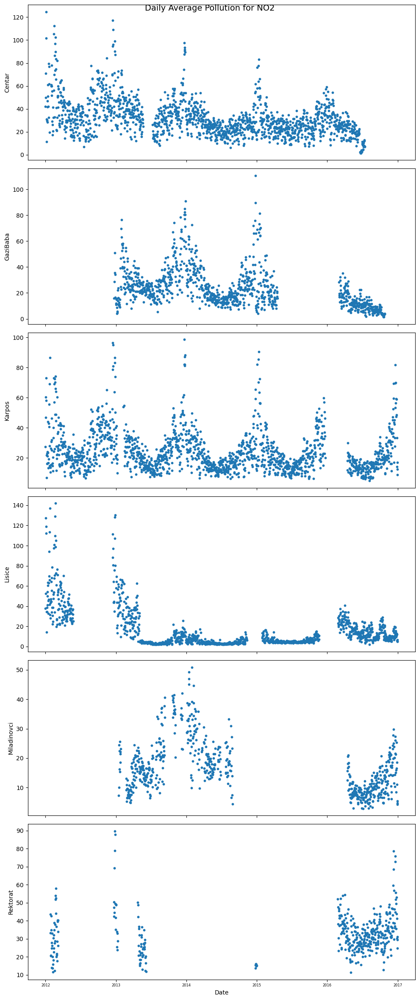

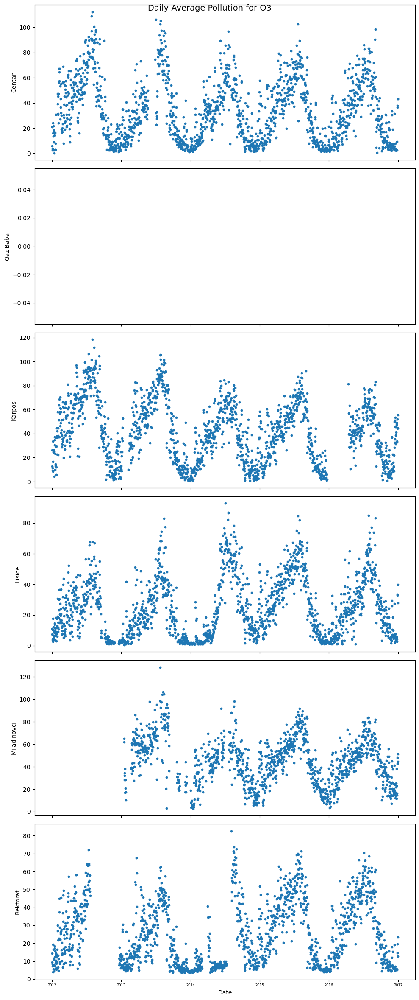

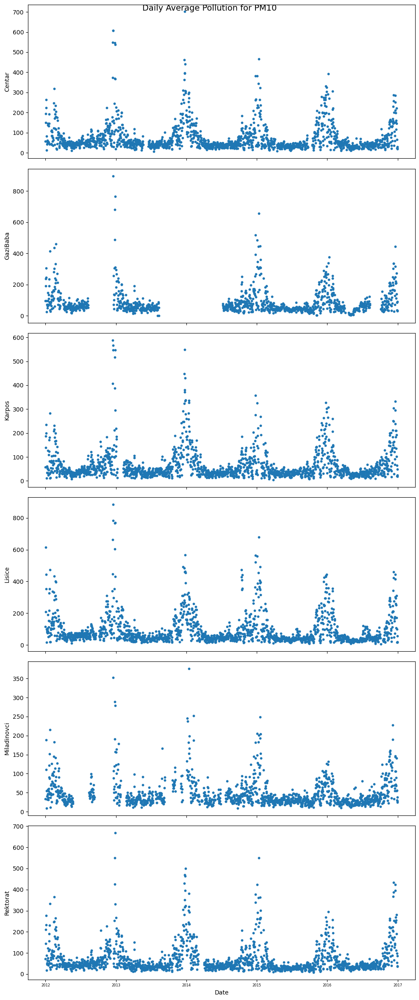

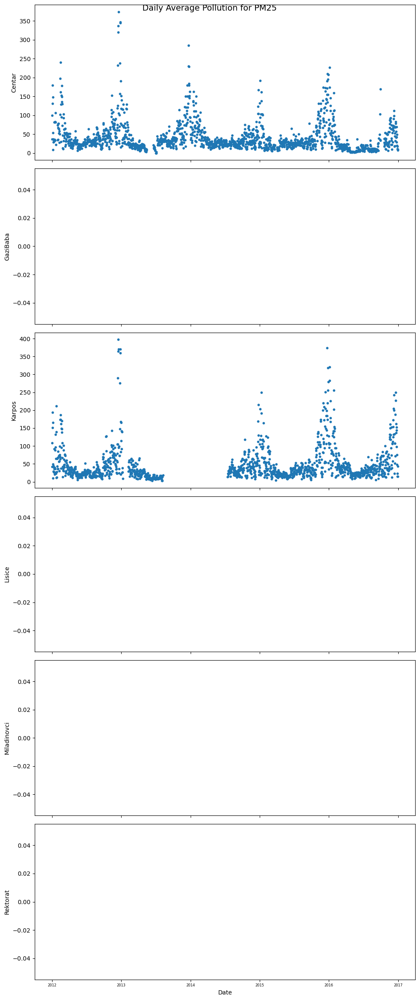

In [31]:
# Solution 2.1

import matplotlib.pyplot as plt
import matplotlib.dates as mdates

pollutants = df['Pollutant'].unique()

for pollutant in pollutants:
    data = df.loc[df['Pollutant'] == pollutant].set_index('Datetime')
    daily_avg = data.groupby(pd.Grouper(freq='D')).mean(numeric_only=True)
    
    locations = daily_avg.columns.tolist()
    num_locations = len(locations)
    
    fig, axes = plt.subplots(num_locations, 1, figsize=(10, num_locations * 4), sharex=True)
    fig.suptitle(f'Daily Average Pollution for {pollutant}', fontsize=14)
    
    for i, location in enumerate(locations):
        ax = axes[i] if num_locations > 1 else axes
        ax.scatter(daily_avg.index, daily_avg[location], s=10)
        ax.set_ylabel(location)
        ax.tick_params(axis='x', labelsize=6)
        
    plt.xlabel('Date')
    plt.tight_layout()
    plt.show()


## Questions 6
If the range of values for PM10 considered safe and unsafe is according to the following scale:

Good                                    0-50

Moderate 	                            51-154

Unhealthy for sensitive individuals 	155-254

Unhealthy 	                            255-354

Very unhealthy                          355-424

Hazardous                               425-504

On how many days in each year, was the average value of PM10 meauserd accross locations worse than moderate?  .......... (3 points)

In [32]:
# Solution

# Filter by PM10
df_pm10 = df[df['Pollutant'] == 'PM10'].copy()

df_pm10.set_index('Datetime', inplace=True)

# Daily average
df_pm10_daily = df_pm10.resample('D').mean(numeric_only=True)

moderate_threshold = (51, 154)
df_pm10_daily['avg_pm10'] = df_pm10_daily[locations].mean(axis=1)  # Calculate average PM10 across locations

print('Days in each year where the average value of PM10 was worse than moderate:')
for location in locations:
    is_over_threshold = df_pm10_daily[location] > moderate_threshold[1]
    days_over_threshold = is_over_threshold.groupby(df_pm10_daily.index.year).sum()
    print(f"{location}:")
    for year in days_over_threshold.index:
        print(f"Year {year}: {days_over_threshold[year]}")

Days in each year where the average value of PM10 was worse than moderate:
Centar:
Year 2012: 31
Year 2013: 33
Year 2014: 21
Year 2015: 40
Year 2016: 26
GaziBaba:
Year 2012: 29
Year 2013: 14
Year 2014: 17
Year 2015: 44
Year 2016: 38
Karpos:
Year 2012: 25
Year 2013: 24
Year 2014: 22
Year 2015: 28
Year 2016: 27
Lisice:
Year 2012: 63
Year 2013: 55
Year 2014: 52
Year 2015: 61
Year 2016: 51
Miladinovci:
Year 2012: 8
Year 2013: 4
Year 2014: 9
Year 2015: 6
Year 2016: 4
Rektorat:
Year 2012: 29
Year 2013: 33
Year 2014: 29
Year 2015: 28
Year 2016: 36


## Question 7
On how many days in each year, was the value of PM10 measured on at least one location worse than moderate? .......... (3 points)

In [35]:
# Solution

df_pm10 = df[df['Pollutant'] == 'PM10']
df_pm10_daily_max = df_pm10.set_index('Datetime')[locations].resample('D').max()
df_pm10_over_threshold = df_pm10_daily_max.apply(lambda x: x > moderate_threshold[1])
days_over_threshold_per_year = df_pm10_over_threshold.any(axis=1).groupby(df_pm10_over_threshold.index.year).sum()

print('On how many days in each year was the value of PM10 measured on at least one location worse than the threshold?\n')
print(days_over_threshold_per_year.to_frame(name='Days over threshold on at least one location'))

On how many days in each year was the value of PM10 measured on at least one location worse than the threshold?

          Days over threshold on at least one location
Datetime                                              
2012                                               243
2013                                               208
2014                                               241
2015                                               190
2016                                               233


## Question 8
Make a bar plot showing the average number of days per year when the measured value for PM10 was worse than moderate on at least one location.  .......... (3 points)

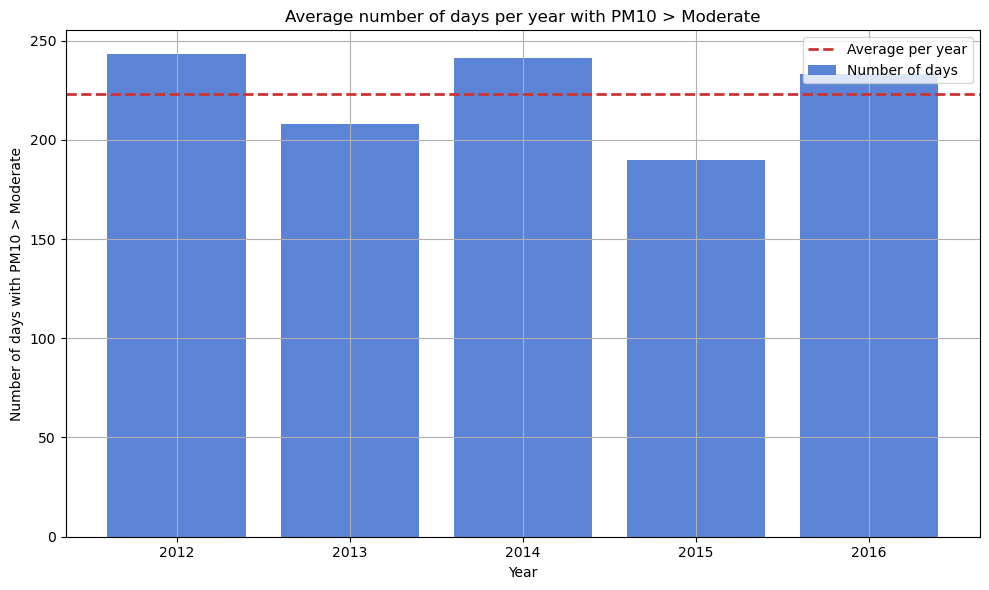

In [34]:
# Solution

avg_days_per_year = days_over_threshold_per_year.mean()

plt.figure(figsize=(10, 6))
plt.bar(days_over_threshold_per_year.index, days_over_threshold_per_year.values, color='#3366cc', alpha=0.8)
plt.axhline(avg_days_per_year, color='#cc3333', linestyle='--', linewidth=2)
plt.xlabel('Year')
plt.ylabel('Number of days with PM10 > Moderate')
plt.title('Average number of days per year with PM10 > Moderate')
plt.legend(['Average per year', 'Number of days'])
plt.grid(True)
plt.tight_layout()
plt.show()